In [26]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random
import os
import tensorflow as tf
import keras as keras
from tensorflow import keras
from tensorflow.keras.utils import load_img, img_to_array
from sklearn.model_selection import train_test_split
from keras import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense

In [28]:
input_path = []
label = []

for class_name in os.listdir("PetImages"):
    for path in os.listdir("PetImages/" + class_name):
        if class_name == "Cat":
            label.append(0)
        else:
            label.append(1)
        input_path.append(os.path.join("PetImages", class_name, path))
    print(input_path[:5])        

['PetImages\\Cat\\0.jpg', 'PetImages\\Cat\\1.jpg', 'PetImages\\Cat\\10.jpg', 'PetImages\\Cat\\100.jpg', 'PetImages\\Cat\\1000.jpg']
['PetImages\\Cat\\0.jpg', 'PetImages\\Cat\\1.jpg', 'PetImages\\Cat\\10.jpg', 'PetImages\\Cat\\100.jpg', 'PetImages\\Cat\\1000.jpg']


In [29]:
len(input_path), len(label)

(25000, 25000)

In [30]:
df = pd.DataFrame()
df["images"] = input_path
df["label"] = label
df = df.sample(frac=1).reset_index(drop=True)
df.head()

,images,label
0,PetImages\Cat\9209.jpg,0
1,PetImages\Cat\11602.jpg,0
2,PetImages\Dog\8054.jpg,1
3,PetImages\Cat\5694.jpg,0
4,PetImages\Dog\7516.jpg,1


In [31]:
for i in df['images']:
    if'.jpg' not in i:
        print(i)    



PetImages\Cat\Thumbs.db
PetImages\Dog\Thumbs.db


In [32]:
df = df[df['images'] != 'PetImages/Cat/Thumbs.db']
df = df[df['images'] != 'PetImages/Dog/Thumbs.db']
df = df[df['images'] != 'PetImages/Cat/666.jpg']
df = df[df['images'] != 'PetImages/Dog/11702.jpg']
len(df)

25000

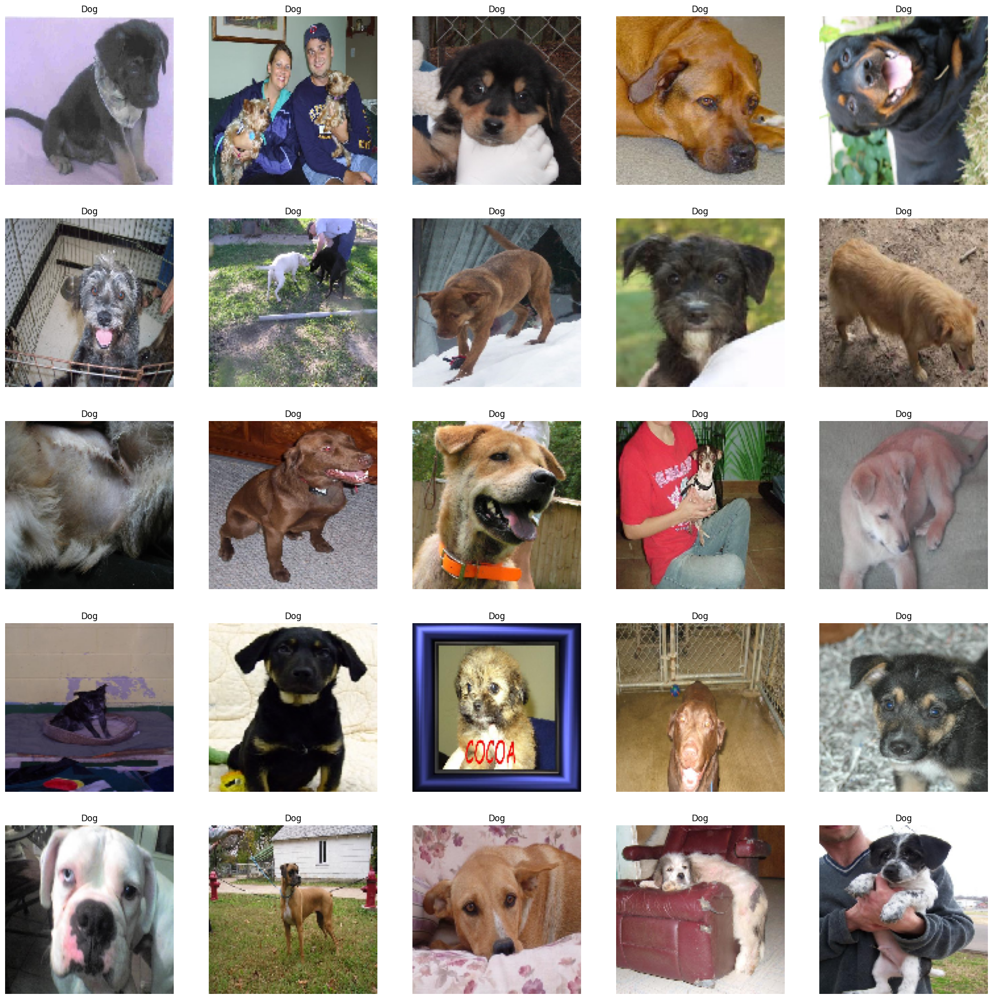

In [33]:
plt.figure(figsize=(25, 25))
temp = df[df["label"]==1]['images']
start = random.randint(0, len(temp))
files = temp[start:start+25]

for index, file in enumerate(files):
    plt.subplot(5, 5, index + 1)
    img = load_img(file, target_size=(128, 128))
    plt.imshow(img)
    plt.title("Dog")
    plt.axis('off')

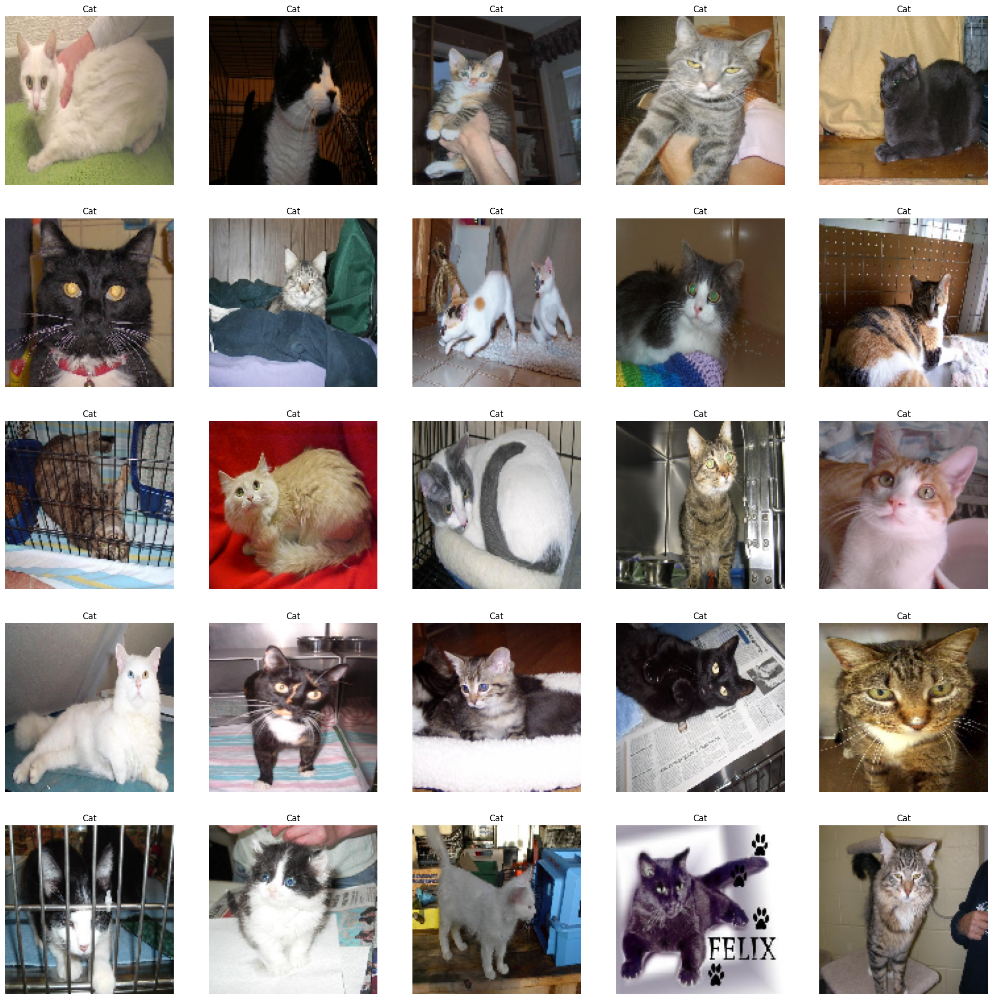

In [34]:
plt.figure(figsize=(25, 25))
temp = df[df["label"]==0]['images']
start = random.randint(0, len(temp))
files = temp[start:start+25]

for index, file in enumerate(files):
    plt.subplot(5, 5, index + 1)
    img = load_img(file, target_size=(128, 128))
    plt.imshow(img)
    plt.title("Cat")
    plt.axis('off')

<Axes: ylabel='count'>

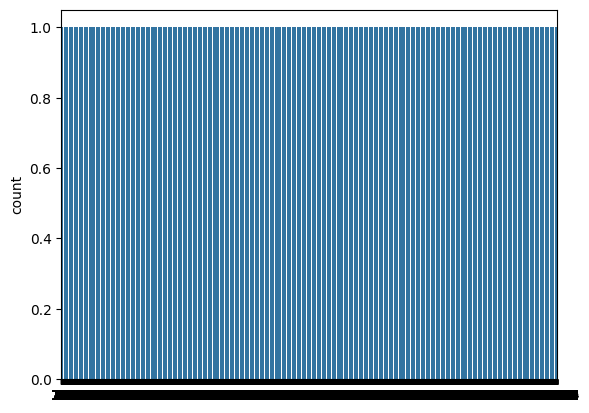

In [35]:
import seaborn as sns
sns.countplot(df['label'])

In [36]:
df['label'] = df['label'].astype('str')

In [37]:
df.head()

,images,label
0,PetImages\Cat\9209.jpg,0
1,PetImages\Cat\11602.jpg,0
2,PetImages\Dog\8054.jpg,1
3,PetImages\Cat\5694.jpg,0
4,PetImages\Dog\7516.jpg,1


In [38]:
from sklearn.model_selection import train_test_split
train, test = train_test_split(df, test_size=0.2, random_state=42)

In [39]:
train.head()

,images,label
23311,PetImages\Dog\10877.jpg,1
23623,PetImages\Cat\7845.jpg,0
1020,PetImages\Dog\7895.jpg,1
12645,PetImages\Cat\4513.jpg,0
1533,PetImages\Cat\9271.jpg,0


In [40]:
test.head()

,images,label
6868,PetImages\Dog\1721.jpg,1
24016,PetImages\Dog\9432.jpg,1
9668,PetImages\Dog\2988.jpg,1
13640,PetImages\Dog\3239.jpg,1
14018,PetImages\Cat\5764.jpg,0


In [41]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
train_generator = ImageDataGenerator(
    rescale=1./255,
    shear_range=0.2,
    zoom_range=0.2,
    rotation_range=40,
    horizontal_flip=True,
    fill_mode='nearest',
)

val_generator = ImageDataGenerator(rescale=1./255)

train_iterator = train_generator.flow_from_dataframe(
 train,
    x_col='images',
    y_col='label',
    target_size=(128, 128),
    class_mode='binary',
    batch_size=512
)

val_iterator = val_generator.flow_from_dataframe(
    test,
        x_col='images',
        y_col='label',
        target_size=(128, 128),
        class_mode='binary',
        batch_size=512
    )

Found 19998 validated image filenames belonging to 2 classes.


d:\py 3.10\lib\site-packages\keras\src\legacy\preprocessing\image.py:920: UserWarning: Found 2 invalid image filename(s) in x_col="images". These filename(s) will be ignored.
  warnings.warn(


Found 5000 validated image filenames belonging to 2 classes.


In [42]:
model = Sequential([
    Conv2D(16, (3, 3), activation='relu', input_shape=(128, 128, 3)),
    MaxPooling2D(2, 2),
    Conv2D(32, (3, 3), activation='relu'),
    MaxPooling2D(2, 2),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D(2, 2),
    Flatten(),
    Dense(512, activation='relu'),
    Dense(1, activation='sigmoid')
])  

d:\py 3.10\lib\site-packages\keras\src\layers\convolutional\base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [43]:
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 126, 126, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 63, 63, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 61, 61, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 30, 30, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 28, 28, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 14, 14, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 12544)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │     6,423,040 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │           513 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,447,137 (24.59 MB)

 Trainable params: 6,447,137 (24.59 MB)

 Non-trainable params: 0 (0.00 B)

In [44]:
history = model.fit(train_iterator, epochs=10, validation_data=val_iterator)

d:\py 3.10\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10
10/40 ━━━━━━━━━━━━━━━━━━━━ 4:12 8s/step - accuracy: 0.5063 - loss: 1.3159

d:\py 3.10\lib\site-packages\PIL\TiffImagePlugin.py:950: UserWarning: Truncated File Read
  warnings.warn(str(msg))


40/40 ━━━━━━━━━━━━━━━━━━━━ 464s 11s/step - accuracy: 0.5068 - loss: 0.7868 - val_accuracy: 0.4952 - val_loss: 0.6905
Epoch 2/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 85s 2s/step - accuracy: 0.5675 - loss: 0.6754 - val_accuracy: 0.6038 - val_loss: 0.6525
Epoch 3/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 86s 2s/step - accuracy: 0.6300 - loss: 0.6446 - val_accuracy: 0.6754 - val_loss: 0.6117
Epoch 4/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 91s 2s/step - accuracy: 0.6638 - loss: 0.6153 - val_accuracy: 0.6982 - val_loss: 0.5917
Epoch 5/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 89s 2s/step - accuracy: 0.7034 - loss: 0.5737 - val_accuracy: 0.7418 - val_loss: 0.5208
Epoch 6/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 93s 2s/step - accuracy: 0.7363 - loss: 0.5292 - val_accuracy: 0.7700 - val_loss: 0.4860
Epoch 7/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 92s 2s/step - accuracy: 0.7462 - loss: 0.5108 - val_accuracy: 0.7790 - val_loss: 0.4698
Epoch 8/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 90s 2s/step - accuracy: 0.7474 - loss: 0.5090 - val_accuracy: 0.7686 - val_loss: 0.4866
E

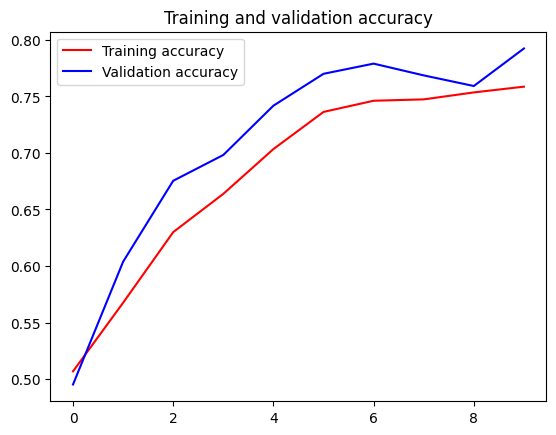

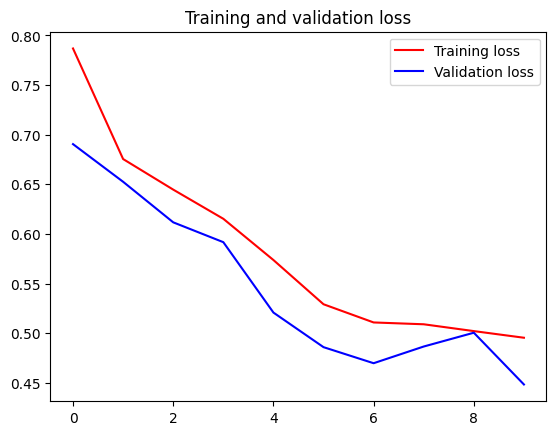

In [45]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
epochs = range(len(acc))

plt.plot(epochs, acc, 'r', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()
plt.figure()

loss = history.history['loss']
val_loss = history.history['val_loss']
plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

In [46]:
import cv2


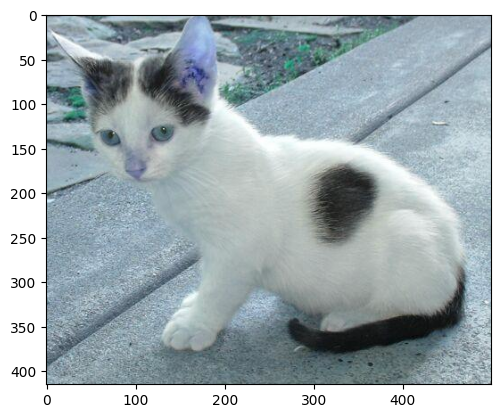

In [75]:
test_img = cv2.imread("D:\\New folder (3)\\Cat.jpg")
plt.imshow(test_img)

In [76]:
test_img = cv2.resize(test_img, (128, 128))
test_img = np.expand_dims(test_img, axis=0)

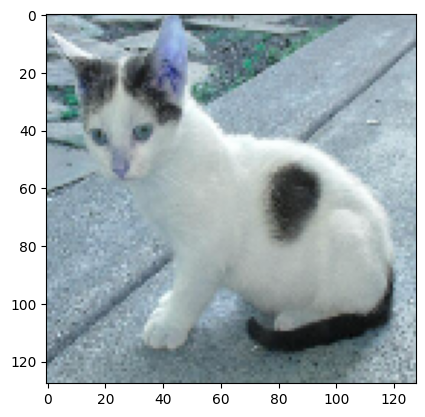

In [77]:
plt.imshow(test_img[0])

In [78]:
test_input = test_img/255.0

In [79]:
prediction = model.predict(test_input)
if prediction < 0.5:
    print("It's a Cat")
else:
    print("It's a Dog")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
It's a Cat


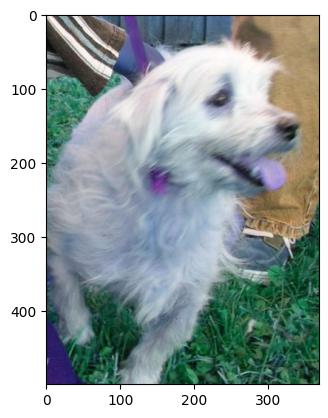

In [86]:
test_img2 = cv2.imread("D:\\New folder (3)\\Dog.jpg")
plt.imshow(test_img2)

In [87]:
test_img2 = cv2.resize(test_img2, (128, 128))
test_img2 = np.expand_dims(test_img2, axis=0)

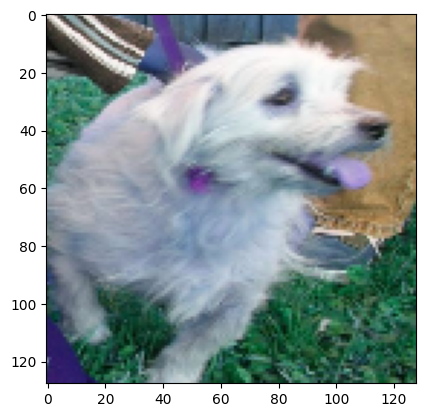

In [88]:
plt.imshow(test_img2[0])

In [89]:
test_input2 = test_img2/255.0

In [94]:
prediction = model.predict(test_input2)
if prediction < 0.5:
    print("It's a Cat")
else:
    print("It's a Dog")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
It's a Dog
